# <h1 align="center"><font color='gray'><b>A Study of Snowfall Trends in a Sample of European Ski Resorts</font></h1></b>

# <h1 align="center"><font color='gray'>&#10052; A Snowsports Perspective &#10052;</font></h1>

***

<b>As an enthusiast of winter sports I have witnessed the decline of our once plentiful winter seasons in place of shorter seasons, poor snow and slushy, patchy or closed runs as you drop altitude to the base.</b>

<b>Or am I just wearing rose tinted glasses of the past?</b>

<b>If not, how drastic has this decline been?</b>

<b>These are some questions I wanted to help answer by mixing my passions for winter sports and data analysis.</b> 

***

## __Define the weather stations used in analysis__
<a class="anchor" id="first-bullet"></a>
The scope will include weather stations in ski resorts from Austria, Switzerland, France and Italy.

Files used in this step:

- meta_all.csv : A metadata file of all 2979 weather stations from all providers. This includes provider, station name, altitude and the date ranges of when each measurement (snow fallen/ snow depth) has been taken.

- european_ski_resorts.csv : Extract from Ski-resort-stats.com (snapshot as of: February 2022). This contains data on 376 European ski resorts.

It is not known which of the 2979 weather stations are in ski resorts. The easiest way of to start to do this is using the extract of European ski resorts to filter the weather station list.

In [1]:
import pandas as pd
pd.set_option('display.max_rows', None)
from fuzzywuzzy import process
import getpass
from IPython.display import Image
import matplotlib.pyplot as plt
import gmplot

In [2]:
meta_data_weather_stations = pd.read_csv("data/resort_station_data/meta_all.csv")
# Remove German and Slovenkian weather stations.
list_of_data_providers = meta_data_weather_stations['Provider'].unique()
providers_to_remove = ['DE_DWD', 'SI_ARSO']
list_of_data_providers_filtered = [item for item in list_of_data_providers if item not in providers_to_remove]
meta_data_weather_stations_french_italian_swiss_austrian = meta_data_weather_stations[meta_data_weather_stations['Provider'].isin(list_of_data_providers_filtered)]

data_on_european_ski_resorts = pd.read_csv("data/resort_station_data/european_ski_resorts.csv")
data_on_european_ski_resorts_resort_country = data_on_european_ski_resorts[['Resort', 'Country', 'HighestPoint', 'LowestPoint']]
french_italian_swiss_austrian_ski_resorts = data_on_european_ski_resorts_resort_country[data_on_european_ski_resorts_resort_country['Country'].isin(['Austria','Switzerland','Italy','France'])]

def fuzzy_join(df1, df2, threshold=70):
    """This function takes the list of weather stations, and the list of ski resorts to try and find matches.
    As the naming convention is not uniform across both fuzzywuzz is used to rough join with a threshold.
    It returns a dataframe of "almost" matches within the threshold including low and high points of the resort."""
    fuzzy_matches = []
    df_at = df2[df2['Country']=='Austria']
    df_ch = df2[df2['Country']=='Switzerland']
    df_fr = df2[df2['Country']=='France']
    df_it = df2[df2['Country']=='Italy']

    for index1, row1 in df1.iterrows():
        name1 = row1['Name']
        country = row1['Provider']
        if country.startswith("AT"):
            match, score, index2 = process.extractOne(name1, df_at['Resort'])
            highest_point = df_at.loc[df_at['Resort']==match, ['HighestPoint']].values.item()
            lowest_point = df_at.loc[df_at['Resort']==match, ['LowestPoint']].values.item()
            if score >= threshold:
                fuzzy_matches.append({'Name_df1': name1,'Name_df2': match, 'Score': score, 'lowest_point': lowest_point, 'highest_point': highest_point})
                
        elif country.startswith("CH"):
            match, score, index2 = process.extractOne(name1, df_ch['Resort'])
            highest_point = df_ch.loc[df_ch['Resort']==match, ['HighestPoint']].values.item()
            lowest_point = df_ch.loc[df_ch['Resort']==match, ['LowestPoint']].values.item()
            if score >= threshold:
                fuzzy_matches.append({'Name_df1': name1,'Name_df2': match, 'Score': score, 'lowest_point': lowest_point, 'highest_point': highest_point})
            
        elif country.startswith("FR"):
            match, score, index2 = process.extractOne(name1, df_fr['Resort'])
            highest_point = df_fr.loc[df_fr['Resort']==match, ['HighestPoint']].values.item()
            lowest_point = df_fr.loc[df_fr['Resort']==match, ['LowestPoint']].values.item()
            if score >= threshold:
                fuzzy_matches.append({'Name_df1': name1,'Name_df2': match, 'Score': score, 'lowest_point': lowest_point, 'highest_point': highest_point})

        elif country.startswith("IT"):
            match, score, index2 = process.extractOne(name1, df_it['Resort'])
            highest_point = df_it.loc[df_it['Resort']==match, ['HighestPoint']].values.item()
            lowest_point = df_it.loc[df_it['Resort']==match, ['LowestPoint']].values.item()
            if score >= threshold:
                fuzzy_matches.append({'Name_df1': name1,'Name_df2': match, 'Score': score, 'lowest_point': lowest_point, 'highest_point': highest_point})

    return pd.DataFrame(fuzzy_matches)

In [3]:
ski_resort_fuzzy_matches = fuzzy_join(meta_data_weather_stations, french_italian_swiss_austrian_ski_resorts)

There are 268 fuzzy matches with a threshold of 70 match. For the purposes of accuracy and maximising the sample the resulting "ski_resort_fuzzy_matches" dataframe has been manually combed with the following findings:

- 43 weather stations to keep that have a threshold below 80.

- 6 weather stations to remove that have a threshold of 80 or above.

All other stations will be kept at this stage.

This was determined by finding obvious inaccurate matches and internet research when unsure. Additional filtering using weather station altitude and exact location will be performed after these steps are complete.

In [4]:
list_of_resorts_to_keep_below_80_fuzzy_score = [
'Gets_les_'
,'Houches_les'
,'Puy_st_vincent_1600'
,'Solden_Kaisers'
,'Chamonix_obs'
,'La_rosiere'
,'Gressoney_La_Trinite'
,'Passo_san_pellegrino'
,'St_francois_long'
,'Le_monetier_les_bains'
,'Passo_san_pellegrino'
,'Le_monetier'
,'L_alpe_d_huez_2350'
,'L_alpe_d_huez_sata_1860'
,'Gutsch_Andermatt'
,'L_alpe_d_huez_2700'
,'L_alpe_d_huez_sata_'
,'Zurs'
,'St_pierre_de_chartreuse'
,'St_martin_de_belleville'
,'Schwarzsee_Bad'
,'Chatel'
,'St_Lambrecht'
,'Megeve'
,'Gsteig_Gstaad'
,'Klosters_KW'
,'Areches'
,'Le_tour'
,'Pozza_di_fassa'
,'Lanslebourg_mt'
,'Kaisers'
,'Ponte_di_Legno'
,'Spital_am_Pyhrn'
,'Les_gets'
,'Les_arcs'
,'Le_grand_bornand_74136400'
,'Le_grand_bornand_74136005'
,'St_colomban_des_villards'
,'Saas_Fee_SAF'
,'Saas_Fee_SAA'
,'La_giettaz'
,'Heiden'
,'Saanenmoser'
]

list_of_resorts_to_remove_80_above_fuzzy_score = [
'Corps'
,'Olmet'
,'Eltendorf'
,'Felbertauerntunnel_Sud'
,'Kobersdorf'
,'Lambrechten'
]

filter_below_80 = ((ski_resort_fuzzy_matches['Score'] < 80) & (ski_resort_fuzzy_matches['Name_df1'].isin(list_of_resorts_to_keep_below_80_fuzzy_score)))
filter_80_above = ((ski_resort_fuzzy_matches['Score'] >= 80) & (~ski_resort_fuzzy_matches['Name_df1'].isin(list_of_resorts_to_remove_80_above_fuzzy_score)))

ski_resort_matches = ski_resort_fuzzy_matches[filter_below_80 | filter_80_above]

weather_stations_french_italian_swiss_austrian_filtered = pd.merge(meta_data_weather_stations_french_italian_swiss_austrian, ski_resort_matches, left_on = 'Name', right_on = 'Name_df1', how='inner')
weather_stations_french_italian_swiss_austrian_filtered = weather_stations_french_italian_swiss_austrian_filtered.drop(['Score','Name_df2', 'Name_df1'], axis=1)

This step resulted in a list of weather stations that were determined to be in/ around ski resorts with the altitude of the weather station and the lowest and highest altitudes of the corresponding ski resort.

To correct any obvious errors in the ski resort altitude data the interquartile ranges are calculated and outliers investigated. This is repeated for weather station altitudes.

After the data is in good order, the dataset for weather stations is simply filtered and any weather stations with altitudes that fall outside of the lowest and highest altitudes of the corresponding ski resort are removed.

Matching with ski resort names put the scope of weather stations in the right area and this puts them within the right altitude range.

To ensure of weather stations are in ski resorts a google map HTML file has been programatically created using the remaining weather stations coordinates.

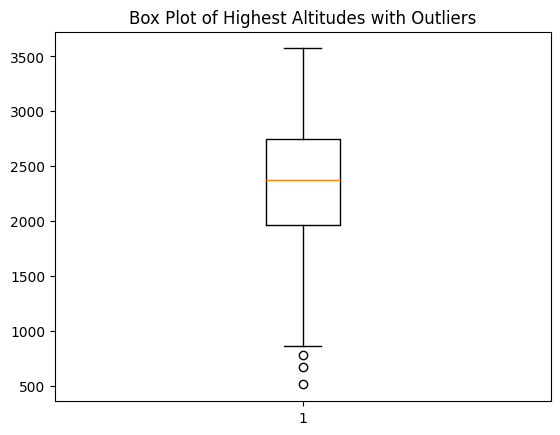

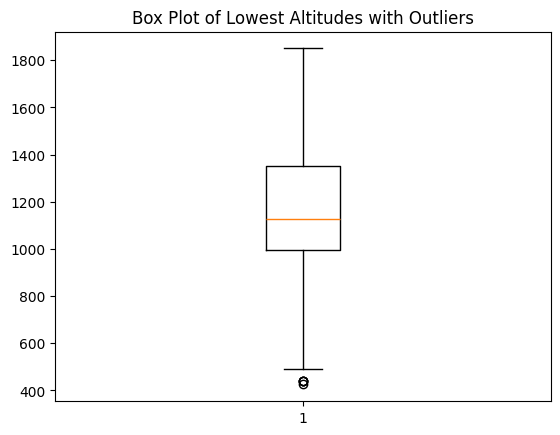

In [5]:
Q1 = weather_stations_french_italian_swiss_austrian_filtered['highest_point'].quantile(0.25)
Q3 = weather_stations_french_italian_swiss_austrian_filtered['highest_point'].quantile(0.75)
IQR = Q3 - Q1

lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

outliers_highest = weather_stations_french_italian_swiss_austrian_filtered[(weather_stations_french_italian_swiss_austrian_filtered['highest_point'] < lower_threshold) | (weather_stations_french_italian_swiss_austrian_filtered['highest_point'] > upper_threshold)]

plt.boxplot(weather_stations_french_italian_swiss_austrian_filtered['highest_point'])
plt.title('Box Plot of Highest Altitudes with Outliers')
plt.show()

Q1 = weather_stations_french_italian_swiss_austrian_filtered['lowest_point'].quantile(0.25)
Q3 = weather_stations_french_italian_swiss_austrian_filtered['lowest_point'].quantile(0.75)
IQR = Q3 - Q1

lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

outliers_lowest = weather_stations_french_italian_swiss_austrian_filtered[(weather_stations_french_italian_swiss_austrian_filtered['lowest_point'] < lower_threshold) | (weather_stations_french_italian_swiss_austrian_filtered['lowest_point'] > upper_threshold)]

plt.boxplot(weather_stations_french_italian_swiss_austrian_filtered['lowest_point'])
plt.title('Box Plot of Lowest Altitudes with Outliers')
plt.show()

In [6]:
outliers_highest

,Provider,Name,Longitude,Latitude,Elevation,HN_year_start,HN_year_end,HS_year_start,HS_year_end,lowest_point,highest_point
14,AT_HZB,Kirchdorf_an_der_Krems,14.121111,47.911389,456.0,1970.0,2016.0,1970.0,2016.0,640,780
30,CH_METEOSWISS,Bad_Ragaz,9.502577,47.016626,496.0,1958.0,2012.0,1958.0,2012.0,490,510
58,CH_SLF,Flumserberg,9.294450,47.089014,1310.0,1952.0,2019.0,1952.0,2019.0,425,665


Notes on these outliers:

- Kirchdorf an der Krems: Using weather station coordinates confirms location is a town in middle Austria. Weather station removed from scope.

- Bad Ragaz: Ski resort has an altitude range between 509 and 2,227 m. As the weather station has an altitude of 496 m it has been removed.

- Flumserberg: Ski resort has an altitude range between 665 and 2,222 m. Both the lowest and highest point are incorrect. Corrections made.

_Cross referenced using official ski resort websites._

In [7]:
outliers_lowest

,Provider,Name,Longitude,Latitude,Elevation,HN_year_start,HN_year_end,HS_year_start,HS_year_end,lowest_point,highest_point
45,CH_METEOSWISS,Kussnacht_am_Rigi,8.430881,47.097560,502.0,2007.0,2020.0,2007.0,2019.0,439,1315
50,CH_METEOSWISS,Rigi_Kaltbad,8.466380,47.044533,1453.0,1966.0,1980.0,1966.0,1980.0,439,1315
51,CH_METEOSWISS,Rigi_Kulm,8.485029,47.056059,1793.0,1930.0,1965.0,1931.0,1965.0,439,1315
58,CH_SLF,Flumserberg,9.294450,47.089014,1310.0,1952.0,2019.0,1952.0,2019.0,425,665
66,CH_SLF,Rigi_Scheidegg,8.522621,47.027284,1640.0,1973.0,2019.0,1973.0,2019.0,439,1315


Notes on these outliers:

- Kussnacht Am Rigi: This is the town at the base of an access gondola to get to a small ski area called Seebodenalp (lowest 1,030 highest 1,225 m). Weather station removed from scope.

- Rigi Kaltbad / Kulm / Scheidegg: Located just around the valley from Kussnacht Am Rigi. These three weather stations are around Rigi ski resort with an altitude range between 1,315 and 1,752 m. Both the lowest and highest point are incorrect. Corrections made.

- Flumserbeg: addressed above.




In [8]:
weather_stations_to_remove = ['Kirchdog_an_der_Krems', 'Kussnacht_am_Rigi','Bad_Ragaz']
weather_stations_french_italian_swiss_austrian_filtered = weather_stations_french_italian_swiss_austrian_filtered[~weather_stations_french_italian_swiss_austrian_filtered['Name'].isin(weather_stations_to_remove)]

rigi_indexes_to_update = [50, 51, 66]

weather_stations_french_italian_swiss_austrian_filtered.loc[rigi_indexes_to_update, 'lowest_point'] = 1315

weather_stations_french_italian_swiss_austrian_filtered.loc[rigi_indexes_to_update, 'highest_point'] = 1752

flumserberg_index_to_update = [58]

weather_stations_french_italian_swiss_austrian_filtered.loc[flumserberg_index_to_update, 'lowest_point'] = 665

weather_stations_french_italian_swiss_austrian_filtered.loc[flumserberg_index_to_update, 'highest_point'] = 2222

# To remove any weather stations whose altitude is not within the altitude range of its corresponding ski resort.
weather_station_scope = weather_stations_french_italian_swiss_austrian_filtered.loc[(weather_stations_french_italian_swiss_austrian_filtered['Elevation'] >= weather_stations_french_italian_swiss_austrian_filtered['lowest_point'])
                                                                                    & (weather_stations_french_italian_swiss_austrian_filtered['Elevation'] <= weather_stations_french_italian_swiss_austrian_filtered['highest_point'])]

weather_station_scope = weather_station_scope.reset_index(drop=True)

Now the gmplot module has been used to plot all in scope remaining weather stations on a map.

In [9]:
api_key = getpass.getpass(prompt='API Key for Google Maps API:')

In [10]:
coordinates_dict = dict(zip(weather_station_scope['Name'], zip(weather_station_scope['Latitude'], weather_station_scope['Longitude'])))
coordinates = list(zip(weather_station_scope['Latitude'], weather_station_scope['Longitude']))

apikey = api_key
gmap = gmplot.GoogleMapPlotter(46.41593426725163, 8.315285437168226, 7, apikey=apikey)


attractions_lats, attractions_lngs = zip(*coordinates)
gmap.scatter(attractions_lats, attractions_lngs, color='#FFFF00', size=40, marker=True)

for resort_name, coordinates in coordinates_dict.items():
    lat, lng = coordinates
    gmap.text(lat, lng, f'({resort_name}', color='#FFFF00')

gmap.draw('data/misc_data/weather_stations_on_map.html')

The above step produces a HTML file with all remaining weather stations mapped on an interactive Google maps extract which is movable and zoomable. This Google Maps extract can be switched to satellite mode.

Sometimes the actual runs are mapped on Google maps. Sometimes they are not. The criterion for inclusion in the study are:

- Weather station within vicinity of a mapped ski run.

- Weather station in vicinity of trees that have been removed to create pistes. 

Below is a screenshot of this HTML file.

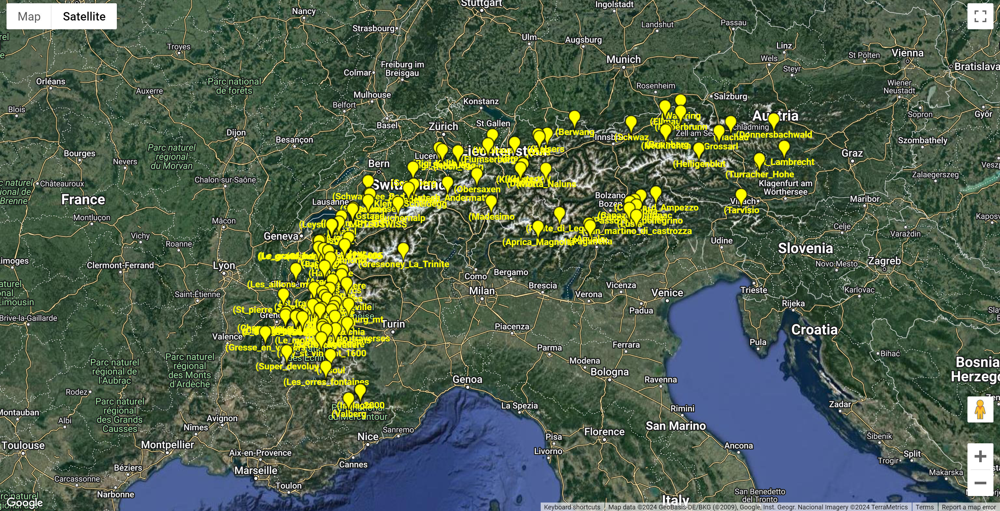

In [11]:
Image(filename='data/misc_data/screenshot_of_weather_stations_on_map_html.png')

From this manual check it was determined that the weather stations that do not meet either criteria and therefore have been removed are:

In [12]:
list_of_weather_stations_to_remove = [
'Puy_st_vincent_1600'
,'Pragelato_traverses'
,'Bardonecchia'
,'Chamrousse_arselle'
,'L_alpe_d_huez_sata_1860'
,'Alpe_d_huez'
,'L_alpe_d_huez_sata_'
,'Besse'
,'Lanslebourg_mt'
,'La_norma'
,'Aussois'
,'Les_menuires'
,'St_martin_de_belleville'
,'St_francois_long'
,'Areches'
,'Megeve'
,'Grand_bornand'
,'Gets_les_'
,'Leysin_CH_METEOSWISS'
,'Gstaad'
,'Saanen'
,'Wildhaus'
,'Davos'
,'Klosters'
,'Ponte_di_Legno'
,'Andalo'
,'Neukirchen'
,'Bramberg'
,'Ellmau'
,'Waidring'
,'Andalo'
]

weather_station_scope_filtered = weather_station_scope[~weather_station_scope['Name'].isin(list_of_weather_stations_to_remove)]
weather_station_scope_filtered = weather_station_scope_filtered.reset_index(drop=True)


# Remove weather stations that do not measure snowfall, did not start measuring snowfall until after the year 2000 or ended measuring before the year 2000.
weather_station_scope_filtered = weather_station_scope_filtered.dropna(subset=['HN_year_start'])

weather_station_scope_filtered['HN_year_start'] = weather_station_scope_filtered['HN_year_start'].astype(int)
weather_station_scope_filtered['HN_year_end'] = weather_station_scope_filtered['HN_year_end'].astype(int)

weather_station_scope_filtered = weather_station_scope_filtered[(weather_station_scope_filtered['HN_year_start'] < 2000) & (weather_station_scope_filtered['HN_year_end'] > 2000)]


def weather_station_altitude_group_classifier(altitude):
    """Define the altitude classifications."""
    if altitude < 1000:
        return "low altitude"
    elif 1000 <= altitude < 1500:
        return "low-medium altitude"
    elif 1500 <= altitude < 2000:
        return "medium altitude"
    else:
        return "high altitude"
    

altitude_classified = weather_station_scope_filtered['Elevation'].apply(weather_station_altitude_group_classifier)

weather_station_scope_filtered["altitude_classified"] = altitude_classified


def country_classifier(provider):
    """Define country from provider prefix."""
    if provider.startswith("AT"):
        return "Austria"
    elif provider.startswith("CH"):
        return "Switzerland"
    elif provider.startswith("IT"):
        return "Italy"
    else:
        return "France"
    
country = weather_station_scope_filtered['Provider'].apply(country_classifier)

weather_station_scope_filtered["country"] = country

So, now to choose a range of years to measure of snowfall (HN). There are a few things considered here:

- Altitude is a very important variable effecting snowfall, so to have a few weather stations from each altitude classification would be ideal.

- A good spread across each country is also beneficial.

- Maximise the range of years of data. The more, the better.

To aid the decision the minimum and maximum years when weather stations started measuring snowfall were found. With the final year of investgation fixed (the year 2016 or later), the start year was iterated from the minimum to the maximum in stages of one year whilst counting how many weather stations measured snowfall within that range of years. This gives a moving picture of how many weather stations could be tracked depending on which range of years were chosen.

In [13]:
dict_to_fill = {}
weather_station_scope_filtered_helper = weather_station_scope_filtered[['altitude_classified','HN_year_start','HN_year_end']]
start_year = weather_station_scope_filtered_helper['HN_year_start'].min()
end_year = weather_station_scope_filtered_helper['HN_year_start'].max()

years_iterator = range(start_year, end_year + 1)
years_iterator

for year in years_iterator:
    data = weather_station_scope_filtered_helper[(weather_station_scope_filtered_helper['HN_year_start'] <= year) & (weather_station_scope_filtered_helper['HN_year_end'] >= 2016)].groupby(["altitude_classified"]).count().to_dict()
    dict_to_fill[year] = data

count_of_stations_in_each_range = pd.DataFrame.from_dict({(i, j): dict_to_fill[i][j] for i in dict_to_fill.keys() for j in dict_to_fill[i].keys()}, orient='index')
count_of_stations_in_each_range.reset_index(inplace=True)

count_of_stations_in_each_range = count_of_stations_in_each_range[['level_0','low-medium altitude','low altitude', 'medium altitude', 'high altitude']]

count_of_stations_in_each_range = count_of_stations_in_each_range.drop_duplicates()

count_of_stations_in_each_range.rename(columns={'level_0':'start_year_of_range'},inplace=True)

In [14]:
count_of_stations_in_each_range

,start_year_of_range,low-medium altitude,low altitude,medium altitude,high altitude
0,1940,1,NaN,NaN,NaN
2,1941,1,NaN,NaN,NaN
4,1942,2,NaN,NaN,NaN
6,1943,2,NaN,NaN,NaN
8,1944,2,NaN,NaN,NaN
10,1945,3,NaN,NaN,NaN
12,1946,3,NaN,NaN,NaN
14,1947,3,NaN,NaN,NaN
16,1948,4,NaN,NaN,NaN
18,1949,4,NaN,NaN,NaN


__Low, low-medium and medium altitude weather stations__ will be investigated between the date range of __1981 > 2016.__


However, __high altitude weather stations__ began tracking snowfall much later so a seperate range of __1995 > 2019__ will be used.

In [15]:
scope_of_weather_stations_l_m = weather_station_scope_filtered[(weather_station_scope_filtered['HN_year_start'] <= 1980) & (weather_station_scope_filtered['HN_year_end'] >= 2016)]
scope_of_weather_stations_h = weather_station_scope_filtered[(weather_station_scope_filtered['HN_year_start'] <= 1995) & (weather_station_scope_filtered['HN_year_end'] >= 2019) & (weather_station_scope_filtered['altitude_classified'] == 'high altitude')]

scope_of_weather_stations = pd.concat([scope_of_weather_stations_l_m,scope_of_weather_stations_h])

***

## __Import, further filter and transform data from each weather station__
<a class="anchor" id="second-bullet"></a>

The scope includes weather stations in ski resorts from Austria, Switzerland, France and Italy.

Files used in this step:

- data_monthly_PROVIDER_CODE.csv : This file contains aggregated monthly snowfall levels for each station. This aggregation is only made if >90% of daily observations are avaliable. As such, NaN are treated as not enough daily observations and if the month is included the snowfall level is estimated. A measurement of 0.0 cm means no snowfall.

In [16]:
import numpy as np
import math
import seaborn as sns 

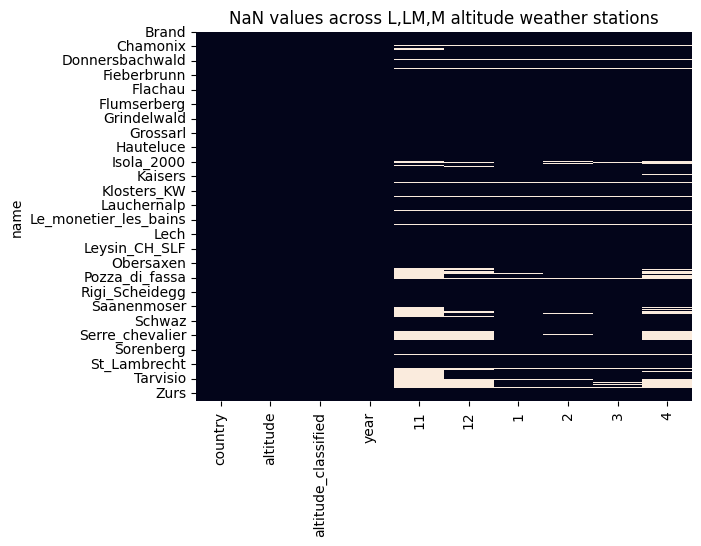

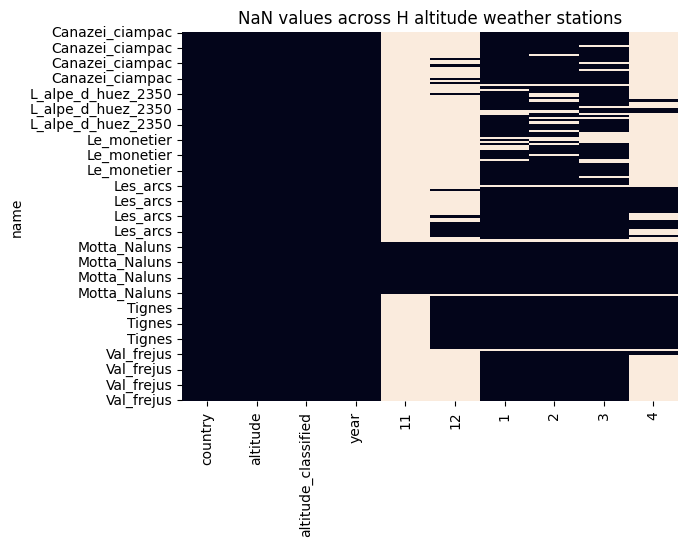

In [17]:
ch_meteoswiss_monthly_data = pd.read_csv("data/monthly_data/data_monthly_CH_METEOSWISS.csv")
at_hzb_monthly_data = pd.read_csv("data/monthly_data/data_monthly_AT_HZB.csv")
meteofrance_monthly_data = pd.read_csv("data/monthly_data/data_monthly_FR_METEOFRANCE.csv")
ch_slf_monthly_data = pd.read_csv("data/monthly_data/data_monthly_CH_SLF.csv")
it_fvg_monthly_data = pd.read_csv("data/monthly_data/data_monthly_IT_FVG.csv")
it_tn_monthly_data = pd.read_csv("data/monthly_data/data_monthly_IT_TN.csv")

all_monthly_data_together = pd.concat([ch_meteoswiss_monthly_data,at_hzb_monthly_data,meteofrance_monthly_data,ch_slf_monthly_data,it_fvg_monthly_data,it_tn_monthly_data])
all_monthly_data_together = pd.merge(all_monthly_data_together,scope_of_weather_stations, on='Name',how='inner').drop(['Longitude','Latitude','HN_year_start','HN_year_end','HS_year_start','HS_year_end','lowest_point','highest_point'], axis=1)


# Filtering low, low-medium and medium altitude stations for date range.
monthly_data_weather_stations_l_m = all_monthly_data_together[(all_monthly_data_together['year'] >= 1980) & (all_monthly_data_together['year'] <= 2016) & (all_monthly_data_together['altitude_classified'] != 'high altitude')]

# And for high altitude stations.
monthly_data_weather_stations_h = all_monthly_data_together[(all_monthly_data_together['year'] >= 1995) & (all_monthly_data_together['year'] <= 2019) & (all_monthly_data_together['altitude_classified'] == 'high altitude')]

# Create a pivot of the monthly data so months are columns.
l_m_scope_pivot = monthly_data_weather_stations_l_m.pivot_table(index=['Name', 'year','Elevation','altitude_classified','country'], columns='month', values='HNsum')
h_scope_pivot = monthly_data_weather_stations_h.pivot_table(index=['Name', 'year','Elevation','altitude_classified','country'], columns='month', values='HNsum')

l_m_scope_pivot.reset_index(inplace=True)
h_scope_pivot.reset_index(inplace=True)

# Remove uncessary columns.
l_m_scope_pivot = l_m_scope_pivot[['Name','country','Elevation','altitude_classified', 'year',1,2,3,4,11,12]]
h_scope_pivot = h_scope_pivot[['Name','country','Elevation','altitude_classified', 'year',1,2,3,4,11,12]]

def change_yearly_basis_for_dataframe(dataframe):
    """This function converts the yearly snowfall data into something that represents a season.
    For each year the months of November, December are taken from the year previous.
    This means losing the first year of measurements for each weather station."""
    
    dict_new_data = {}
    for index in dataframe.index:
        row = dataframe.loc[index]
        weather_station_name = row['Name']

        if index==0:
            country = row['country']
            altitude = row['Elevation']
            altitude_classified = row['altitude_classified']
            november_value = row[11]
            december_value = row[12]

        elif index==1:
            january_value = row[1]
            february_value = row[2]
            march_value = row[3]
            april_value = row[4]
            year = row['year']
            new_row_dict = {
                'name': weather_station_name,
                'country': country,
                'altitude': altitude,
                'altitude_classified': altitude_classified,
                'year': year,
                11: november_value,
                12: december_value,
                1: january_value,
                2: february_value,
                3: march_value,
                4: april_value,
            }
            dict_new_data[index] = new_row_dict

        else:
            previous_row = dataframe.loc[index-1]
            previous_weather_station_name = previous_row['Name']
            if weather_station_name == previous_weather_station_name:
                country = row['country']
                altitude = row['Elevation']
                altitude_classified = row['altitude_classified']
                current_row_year = row['year']
                previous_row_year = previous_row['year']
                if current_row_year - previous_row_year == 1:
                    ## Next years entry for the same station so takes the previous years nov, dec values
                    november_value = previous_row[11]
                    december_value = previous_row[12]
                    january_value = row[1]
                    february_value = row[2]
                    march_value = row[3]
                    april_value = row[4]
                    new_row_dict = {
                            'name': weather_station_name,
                            'country': country,
                            'altitude': altitude,
                            'altitude_classified': altitude_classified,
                            'year': current_row_year,
                            11: november_value,
                            12: december_value,
                            1: january_value,
                            2: february_value,
                            3: march_value,
                            4: april_value,
                        }
                    dict_new_data[index] = new_row_dict

                else:
                    ## Missing year so cannot take the previous years nov, dec values. They are NULL
                    november_value = np.NaN
                    december_value = np.NaN
                    january_value = row[1]
                    february_value = row[2]
                    march_value = row[3]
                    april_value = row[4]
                    country = row['country']
                    altitude = row['Elevation']
                    altitude_classified = row['altitude_classified']
                    current_row_year = row['year']
                    new_row_dict = {
                            'name': weather_station_name,
                            'country': country,
                            'altitude': altitude,
                            'altitude_classified': altitude_classified,
                            'year': current_row_year,
                            11: november_value,
                            12: december_value,
                            1: january_value,
                            2: february_value,
                            3: march_value,
                            4: april_value,
                        }
                    dict_new_data[index] = new_row_dict

            else:
                ## New station. Value required for the loop to work but saved a value of 'delete_me' for easily deletion.
                country = row['country']
                current_row_year = row['year']
                altitude_classified = row['altitude_classified']
                altitude = row['Elevation']
                november_value = np.NaN
                december_value = np.NaN
                january_value = np.NaN
                february_value = np.NaN
                march_value = np.NaN
                april_value = np.NaN
                new_row_dict = {
                        'name': weather_station_name,
                        'country': country,
                        'altitude': altitude,
                        'altitude_classified': altitude_classified,
                        'year': current_row_year,
                        11: november_value,
                        12: december_value,
                        1: january_value,
                        2: february_value,
                        3: march_value,
                        4: april_value,
                    }
                dict_new_data[index] = new_row_dict

    return dict_new_data

l_m_scope = pd.DataFrame.from_dict(change_yearly_basis_for_dataframe(l_m_scope_pivot), orient='index')
l_m_scope[11] = pd.to_numeric(l_m_scope[11], errors='coerce')

h_scope = pd.DataFrame.from_dict(change_yearly_basis_for_dataframe(h_scope_pivot), orient='index')
h_scope[11] = pd.to_numeric(h_scope[11], errors='coerce')

scope_index = l_m_scope.set_index('name')
sns.heatmap(scope_index.isnull(), cbar=False)
plt.title('NaN values across L,LM,M altitude weather stations')
plt.show()

scope_index = h_scope.set_index('name')
sns.heatmap(scope_index.isnull(), cbar=False)
plt.title('NaN values across H altitude weather stations')
plt.show()

Observations regarding the spread of NaN values across __low/ low medium/ medium weather stations__:

- Many weather stations with measurements for every month.

- However, also weather stations with high number of NaNs across all months.

- Many cases of NaNs in just one month column (usually November or April).

_Month range per season year will be November, December, January, February, March and April._

Similarily across __high weather stations:__

- Missing months of measurement are numerous. 

- The months of January, February and March have the most amount of measurements.

_Month range per season year will be January, February, March and April._

Snowfall data is especially hard to predict which makes filling in NaN values with averages or median values likely to create inaccuracy in data. __Years that have more than one NaN value across months are removed.__

For any that just have one missing month the value is imputed using some logic. Altitude and current season snowfall levels are the biggest indicators of snowfall. Location is not as reliable as the European Alps are closely spread with many resorts overlapping multiple countries.

The logic __for each altitude classification__:
- An average snowfall is taken for each month across all years in range.
- A ratio is created per month by dividing the average snowfall per month by the total average snowfall.
- NaN values are filled in by multiplying the ratio by the snowfall total of the months that have measurements.

In other words this is imputation by proportional distribution.

#### One process for Low, Low Medium and Medium Altitude weather stations

In [18]:
month_in_scope_for_l_lm_m = [11, 12, 1, 2, 3, 4]

null_counts = l_m_scope[month_in_scope_for_l_lm_m].isnull().sum(axis=1)

l_m_scope = l_m_scope[null_counts <= 1]

# Calculate the means for each altitude for each month within scope.
column_ratios_by_altitude = l_m_scope.groupby('altitude_classified')[month_in_scope_for_l_lm_m].mean()
column_ratios_by_altitude.reset_index(inplace=True)

def calculate_ratio(row):
    """Calculates the proportional distribution for each month split by altitude classifications."""
    total = row[11] + row[12] + row[1] + row[2] + row[3] + row[4]
    return row[[11, 12, 1, 2, 3, 4]] / total

column_ratios_by_altitude[[11, 12, 1, 2, 3, 4]] = column_ratios_by_altitude.apply(calculate_ratio, axis=1)

def weighted_mean_calculator(row):
    """This function fills in missing values.
    Imputation is based on the proportional distribution of values for each altitude classification.
    """
    total_weight_for_row = 1
    x_w_for_row = 0
    row_total = row[month_in_scope_for_l_lm_m].sum()
    if math.isnan(row[11]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],11].iloc[0]
        weighted_average = row_total * weight
        row[11] = weighted_average

    if math.isnan(row[12]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],12].iloc[0]
        weighted_average = row_total * weight
        row[12] = weighted_average

    if math.isnan(row[1]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],1].iloc[0]
        weighted_average = row_total * weight
        row[1] = weighted_average

    if math.isnan(row[2]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],2].iloc[0]
        weighted_average = row_total * weight
        row[2] = weighted_average

    if math.isnan(row[3]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],3].iloc[0]
        weighted_average = row_total * weight
        row[3] = weighted_average

    if math.isnan(row[4]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],4].iloc[0]
        weighted_average = row_total * weight
        row[4] = weighted_average
    return row

l_m_scope = l_m_scope.apply(weighted_mean_calculator, axis=1)

l_m_scope['total']= l_m_scope[month_in_scope_for_l_lm_m].sum(axis=1)


#### Similar process for High Altitude weather stations

In [19]:
h_scope = h_scope.drop([11,12], axis=1)

# Smaller scope for high alttiude weather stations. This was decided by looking at the heatmap above of NaN values.
months_in_scope_for_h = [1, 2, 3, 4]

null_counts = h_scope[months_in_scope_for_h].isnull().sum(axis=1)

h_scope = h_scope[null_counts <= 1]

# Calculate the means for each altitude for each month within scope.
column_ratios_by_altitude = h_scope.groupby('altitude_classified')[months_in_scope_for_h].mean()
column_ratios_by_altitude.reset_index(inplace=True)

def calculate_ratio(row):
    """Calculates the proportional distribution for each month split by altitude classifications."""
    total = row[1] + row[2] + row[3] + row[4]
    return row[[1, 2, 3, 4]] / total

column_ratios_by_altitude[months_in_scope_for_h] = column_ratios_by_altitude.apply(calculate_ratio, axis=1)

def weighted_mean_calculator(row):
    """This function fills in missing values.
    Imputation is based on the proportional distribution of values for each altitude classification.
    """
    total_weight_for_row = 1
    x_w_for_row = 0
    row_total = row[months_in_scope_for_h].sum()

    if math.isnan(row[1]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],1].iloc[0]
        weighted_average = row_total * weight
        row[1] = weighted_average

    if math.isnan(row[2]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],2].iloc[0]
        weighted_average = row_total * weight
        row[2] = weighted_average

    if math.isnan(row[3]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],3].iloc[0]
        weighted_average = row_total * weight
        row[3] = weighted_average

    if math.isnan(row[4]):
        weight = column_ratios_by_altitude.loc[column_ratios_by_altitude['altitude_classified']==row['altitude_classified'],4].iloc[0]
        weighted_average = row_total * weight
        row[4] = weighted_average
    return row

h_scope = h_scope.apply(weighted_mean_calculator, axis=1)

h_scope['total']= h_scope[months_in_scope_for_h].sum(axis=1)

# Fill in November and December so we can concatonate our two dataframes.
h_scope[11] = np.nan
h_scope[12] = np.nan

all_scope = pd.concat([l_m_scope,h_scope])

***

## __Visualise the data__
<a class="anchor" id="third-bullet"></a>

Plotting one scatter per altitude classification with a mean trendline. Also utilising sklearn's module a linear regression line has been added to show an overall trend.

In [20]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

<Figure size 800x2000 with 0 Axes>

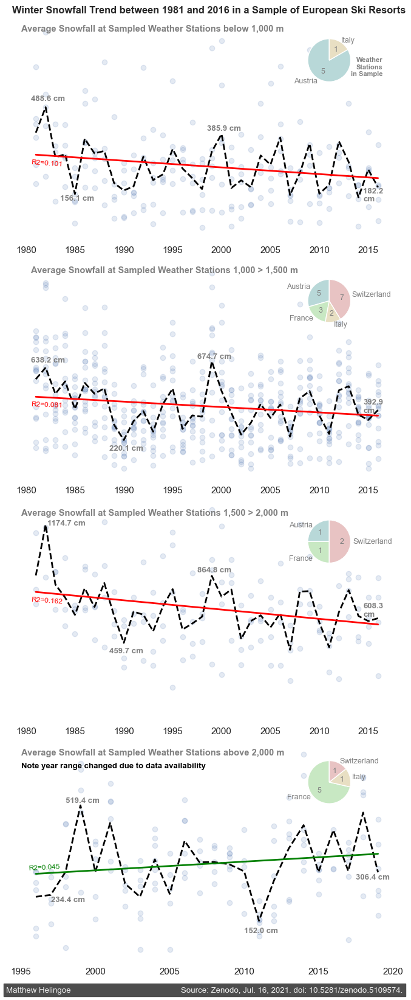

In [21]:
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial'] 

sns.set_theme(style="whitegrid")

def add_pie_chart(ax, data):
    """Creates a pie chart per ax"""
    label_colors = {'Austria': '#B8D8D8', 'Switzerland': '#E8C3C3', 'France':'#C8E8C3', 'Italy':'#E8DFC3'}
    unique_names_per_country = data.groupby('country')['name'].nunique()
    small_pie_ax = ax.inset_axes([0.7, 0.7, 0.25, 0.25])
    wedges, texts, autotexts = small_pie_ax.pie(unique_names_per_country, labels = unique_names_per_country.index, autopct=lambda p: f'{int(p*sum(unique_names_per_country))/100:.0f}', startangle=90, colors=[label_colors[label] for label in unique_names_per_country.index],textprops=dict(fontfamily='sans-serif'))
    for text, autotext in zip(texts, autotexts):
        text.set_color('grey')
        text.set_fontsize(9)
        autotext.set_color('grey')
        autotext.set_fontsize(9)

plt.figure(figsize=(8, 20))

fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1,
                                        figsize=(8,20))
axes = [ax1, ax2, ax3, ax4]

for ax in axes:
    ax.grid(False)
    ax.set_yticklabels([])
    ax.tick_params(bottom=0, left=0) 
    for location in ['left', 'right', 'top', 'bottom']:
        ax.spines[location].set_visible(False)


data = all_scope[all_scope['altitude_classified']=='low altitude']

ax1.scatter(data['year'], data['total'], alpha=0.15)
mean_values = data.groupby('year')['total'].mean()
ax1.plot(mean_values.index, mean_values, label='Mean', color='black', linestyle='--', linewidth=2)
X = mean_values.index.values.reshape(-1, 1)
y = mean_values.values.reshape(-1, 1)
reg = LinearRegression().fit(X, y)
trendline = reg.predict(X)
ax1.plot(mean_values.index, trendline, label='Trendline', color='red', linestyle='-', linewidth=2)
add_pie_chart(ax1, data)
ax1.set_yticks(np.arange(0, 900, 200))
ax1.text(1978.55, 850, 'Winter Snowfall Trend between 1981 and 2016 in a Sample of European Ski Resorts',
         size=11.75, weight='bold')
ax1.text(1979.5, 780, 'Average Snowfall at Sampled Weather Stations below 1,000 m',
         size=10.50, weight='bold', color='grey') 
ax1.text(2016.5, 610, 'Weather\nStations\nin Sample',
         size=8, weight='bold', color='grey', horizontalalignment = 'right') 
r_squared = reg.score(X, y)
r2_value = round(r_squared, 3)
ax1.text(1980.5, 265, f'R2={r2_value}',
         size=8.5, color='red', rotation = -4) 
ax1.text(1980.5, 515, '488.6 cm',
         size=9.50, weight='bold', color='grey') 
ax1.text(1983.5, 132, '156.1 cm',
         size=9.50, weight='bold', color='grey') 
ax1.text(1998.5, 400.5, '385.9 cm',
         size=9.50, weight='bold', color='grey') 
ax1.text(2014.5, 129.5, '182.2\ncm',
         size=9.50, weight='bold', color='grey') 


data = all_scope[all_scope['altitude_classified']=='low-medium altitude']

ax2.scatter(data['year'], data['total'], alpha=0.15)
mean_values = data.groupby('year')['total'].mean()
ax2.plot(mean_values.index, mean_values, label='Mean', color='black', linestyle='--', linewidth=2)
X = mean_values.index.values.reshape(-1, 1)
y = mean_values.values.reshape(-1, 1)
reg = LinearRegression().fit(X, y)
trendline = reg.predict(X)
ax2.plot(mean_values.index, trendline, label='Trendline', color='red', linestyle='-', linewidth=2)
add_pie_chart(ax2, data)
ax2.set_yticks(np.arange(0, 1300, 400))
r_squared = reg.score(X, y)
r2_value = round(r_squared, 3)
ax2.text(1980.5, 410, f'R2={r2_value}',
         size=8.5, color='red', rotation = -2) 
ax2.text(1980.5, 1188, 'Average Snowfall at Sampled Weather Stations 1,000 > 1,500 m',
         size=10.50, weight='bold', color = 'grey') 
ax2.text(1980.5, 670, '638.2 cm',
         size=9.50, weight='bold', color='grey')
ax2.text(1988.5, 160, '220.1 cm',
         size=9.50, weight='bold', color='grey')
ax2.text(1997.5, 690.5, '674.7 cm',
         size=9.50, weight='bold', color='grey') 
ax2.text(2014.5, 380.5, '392.9\ncm',
         size=9.50, weight='bold', color='grey') 


data = all_scope[all_scope['altitude_classified']=='medium altitude']

ax3.scatter(data['year'], data['total'], alpha=0.15)
mean_values = data.groupby('year')['total'].mean()
ax3.plot(mean_values.index, mean_values, label='Mean', color='black', linestyle='--', linewidth=2)
X = mean_values.index.values.reshape(-1, 1)
y = mean_values.values.reshape(-1, 1)
reg = LinearRegression().fit(X, y)
trendline = reg.predict(X)
ax3.plot(mean_values.index, trendline, label='Trendline', color='red', linestyle='-', linewidth=2)
ax3.set_ylim([50, 1300]) 
add_pie_chart(ax3, data)
ax3.set_yticks(np.arange(0, 1400, 400))
r_squared = reg.score(X, y)
r2_value = round(r_squared, 3)
ax3.text(1980.5, 700, f'R2={r2_value}',
         size=8.5, color='red', rotation = -4) 
ax3.text(1979.5, 1230, 'Average Snowfall at Sampled Weather Stations 1,500 > 2,000 m',
         size=10.50, weight='bold', color = 'grey') 
ax3.text(1982.2, 1172, '1174.7 cm',
         size=9.50, weight='bold', color='grey')
ax3.text(1988.5, 400, '459.7 cm',
         size=9.50, weight='bold', color='grey')
ax3.text(1997.5, 890.5, '864.8 cm',
         size=9.50, weight='bold', color='grey')
ax3.text(2014.5, 620.5, '608.3\ncm',
         size=9.50, weight='bold', color='grey') 


data = all_scope[all_scope['altitude_classified']=='high altitude']

ax4.scatter(data['year'], data['total'], alpha=0.15)
mean_values = data.groupby('year')['total'].mean()
ax4.plot(mean_values.index, mean_values, label='Mean', color='black', linestyle='--', linewidth=2)
X = mean_values.index.values.reshape(-1, 1)
y = mean_values.values.reshape(-1, 1)
reg = LinearRegression().fit(X, y)
trendline = reg.predict(X)
ax4.plot(mean_values.index, trendline, label='Trendline', color='green', linestyle='-', linewidth=2)
unique_names_per_country = data.groupby('country')['name'].nunique()
add_pie_chart(ax4, data)
r_squared = reg.score(X, y)
r2_value = round(r_squared, 3)
ax4.text(1995.5, 314, f'R2={r2_value}',
         size=8.5, color='green', rotation = 3) 
ax4.text(1995, 680, 'Average Snowfall at Sampled Weather Stations above 2,000 m',
         size=10.50, weight='bold', color = 'grey') 
ax4.text(1995, 640, 'Note year range changed due to data availability',
         size=9.50, weight='bold', color = 'black') 
ax4.text(1994, -75, 'Matthew Helingoe' + ' '*50 + 'Source: Zenodo, Jul. 16, 2021. doi: 10.5281/zenodo.5109574.',
        color = '#f0f0f0', backgroundcolor = '#4d4d4d',
       size=9.5)
ax4.text(1997, 213, '234.4 cm',
         size=9.50, weight='bold', color='grey')
ax4.text(1998, 530, '519.4 cm',
         size=9.50, weight='bold', color='grey')
ax4.text(2010, 114, '152.0 cm',
         size=9.50, weight='bold', color='grey')
ax4.text(2017.5, 285, '306.4 cm',
         size=9.50, weight='bold', color='grey')

plt.subplots_adjust(hspace=0.12)

plt.show()

#### The above graph represents the following weather stations:

<div style="display: flex; justify-content: space-between;">
    <div style="width: 22%; background-color: #FFFFFF; padding: 10px;">
        <p><b>Low Altitude (<1,000 m)</b><br>
        <i>Measurements between November to April</i></p>

<p>- Schwaz (Austria, 548 m)<br>
- Tarvisio (Italy, 777 m)<br>
- Fieberbrunn (Austria, 850 m)<br>
- Grossarl (Austria, 890 m)<br>
- Flachau (Austria, 910 m)<br>
- Donnersbachwald (Austria, 980 m)<br>
</p>
    </div>
    <div style="width: 22%; background-color: #FFFFFF; padding: 10px;">
        <p><b>Low - Medium Altitude (1,000 m> 1,500 m)</b><br>
        <i>Measurements between November to April</i></p>

<p>- Brand (Austria, 1,005 m)<br>
- Chamonix (France, 1,042 m)<br>
- St Lambrecht (Austria, 1,070 m)<br>
- Sorenberg (Switzerland, 1,150 m)<br>
- Grindelwald (Switzerland, 1,152 m)<br>
- Klosters (Switzerland, 1,190 m)<br>
- Hauteluce (France, 1,215 m)<br>
- Leysin (Switzerland, 1,300 m)<br>
- Flumserberg (Switzerland, 1,310 m)<br>
- Kaisers (Austria, 1,380 m)<br>
- Heiligenblut (Austria, 1,380 m)<br>
- Pozza di Fassa (Italy, 1,385 m)<br>
- Saanenmoser (Switzerland, 1,390 m)<br>
- Obersaxen (Switzerland, 1,420 m)<br>
- Le Mon&ecirc;tier-les-Bains (France 1,459 m)<br>
- Lech (Austria, 1,480 m)<br>
- San Martino di Castrozza (Italy, 1,465 m)</p>
    </div>
    <div style="width: 22%; background-color: #FFFFFF; padding: 10px;">
        <p><b>Medium Altitude (1,500 m> 2,000 m)</b><br>
        <i>Measurements between November to April</i></p>
<p>- Rigi Scheidegg (Switzerland, 1,640 m)<br>
- Zurs (Austria, 1,707 m)<br>
- Isola 2000 (France, 1,912 m)<br>
- Lauchernalp (Switzerland, 1,975 m)</p>
    </div>
    <div style="width: 22%; background-color: #FFFFFF; padding: 10px;">
        <p><b>High Altitude (> 2,000 m) Weather Stations<br></b>
<i>Measurements between January to April</i></p>

<p>- Les Arcs (France, 2,040 m)<br>
- Tignes (France, 2,080 m)<br>
- Canazei Ciampac (Italy, 2,145 m)<br>
- Motta Naluns (Switzerland, 2,150 m)<br>
- Serre Chevalier (France, 2,185 m)<br>
- Valfr&eacute;jus (France, 2,208 m)<br>
- L'Alpe d'Huez 2350 (France, 2,350 m)</p>
    </div>
</div>

## __Observations__
<a class="anchor" id="fourth-bullet"></a>
<i> Any observations must take into account that our sample size is relatively small compared to the total population of ski resorts across the European Alps. However we can still see some obvious trends in snowfall levels.</i>


<B>Average snowfall level across our low, low-medium and medium altitude weather stations has dropped considerably from 1981 to 2016</B> with the <B>greatest decrease in average snowfall level at medium altitudes</B>.

<B>On average high altitude weather stations have seen an increase in snowfall from 1995 to 2019.</B>

These two findings are supported by academic research on snow cover in the Alps. As our climate changes, and temperatures and precipitation levels increase, our lower altitude alpine environments are experiencing more rain, whilst our colder high altitude alpine environments are experiencing heavier flurries of snow. As global temperatures continue to rise this differentiation may change. 

Lower overall snowfall with higher temperatures in spring and summer lead to faster melting and a shortening of the snow cover period. This adversely affects groundwater supplies and the alpine biosphere and the impact is much wider than people wanting to slide on some snow. 


<B> But what <i>could</i> this mean for a snowsports lover?</B>

As these trends continue it will become less economically viable to run a resort at lower altitudes. Smaller, local resorts across Austria, Switzerland, France and Italy will be forced to stop operating. The market will therefore have to travel to higher altitude resorts putting strain on the local and mountain infrastructure which will result in higher prices, more queues and busier pistes. In addition the winter snowsports season will be shortened.

In higher altitude resorts you could expect closed runs near the base <i>but</i> more powder days in the colder winter months. However, this report doesn't take into account the water (or weight) of the snow. You could expect as temperatures across all alpine environments increase so to will the water content of the snow. This results in heavier snow and a decrease in powder quality.

__Writing this as a skier is not easy.__ It helps put the environmental crisis into perspective. I hope this has the same effect on the reader to think about the ways to reduce your carbon footprint. 


## __Bibliography__
<a class="anchor" id="fifth-bullet"></a>

A huge thank you to the Cyrosphere for collating this data together and putting it on a public repository for use. Specifically the authors of this paper:

Matiu, M. (2021) ‘Snow cover in the European Alps: Station observations of snow depth and depth of snowfall’. Zenodo. doi: 10.5281/zenodo.5109574. - https://tc.copernicus.org/articles/15/1343/2021/tc-15-1343-2021.html

And Kaggle for this dataset - https://www.kaggle.com/datasets/thomasnibb/european-ski-resorts?resource=download
